# Fourier Transform

Image showing that we cannot infer from the Fourier Transform at which time the frequency information occurs

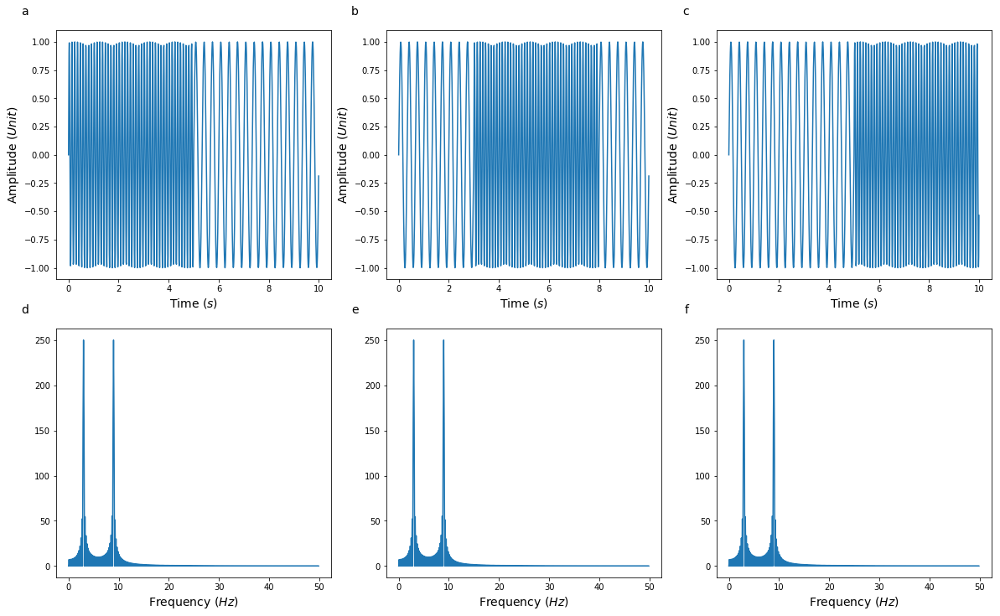

In [2]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 3, figsize=(20,12))

samp = 100
high_freq = 9
low_freq = 3

font_size = 14

t1 = np.linspace(0, 5, 5 * samp, endpoint=False)
t2 = np.linspace(5, 10, 5 * samp, endpoint=False)
s1 = np.sin(2*np.pi*high_freq*t1)
s2 = np.sin(2*np.pi*low_freq*t2)
t_c = np.append(t1, t2)
s_c = np.append(s1, s2)

ax[0,0].plot(t_c,s_c)
ax[0,0].set_xlabel('Time ($s$)', fontsize=font_size)
ax[0,0].set_ylabel('Amplitude ($Unit$)', fontsize=font_size)
ax[0,0].text(-0.1, 1.1, 'a', transform=ax[0, 0].transAxes,fontsize=font_size, va='top', ha='right')

Y = np.fft.fft(s_c)

N = len(Y)/2+1
dt = t_c[1] - t_c[0]
fa = 1.0/dt # scan frequency
X = np.linspace(0, fa/2, N, endpoint=False)

ax[1, 0].plot(X, np.abs(Y[:N]))
ax[1, 0].set_xlabel('Frequency ($Hz$)', fontsize=font_size)
ax[1,0].text(-0.1, 1.1, 'd', transform=ax[1, 0].transAxes,fontsize=font_size, va='top', ha='right')

t1 = np.linspace(0, 3, 300, endpoint=False)
t2 = np.linspace(3, 8, 500, endpoint=False)
t3 = np.linspace(8, 10, 200, endpoint=False)
s1 = np.sin(2*np.pi*3*t1)
s2 = np.sin(2*np.pi*9*t2)
s3 = np.sin(2*np.pi*3*t3)
t_c = np.append(t1, np.append(t2, t3))
s_c = np.append(s1, np.append(s2, s3))

ax[0,1].plot(t_c,s_c)
ax[0,1].set_xlabel('Time ($s$)', fontsize=font_size)
ax[0,1].set_ylabel('Amplitude ($Unit$)', fontsize=font_size)
ax[0,1].text(-0.1, 1.1, 'b', transform=ax[0, 1].transAxes,fontsize=font_size, va='top', ha='right')

Y = np.fft.fft(s_c)

N = len(Y)/2+1
dt = t_c[1] - t_c[0]
fa = 1.0/dt # scan frequency
X = np.linspace(0, fa/2, N, endpoint=False)

ax[1, 1].plot(X, np.abs(Y[:N]))
ax[1, 1].set_xlabel('Frequency ($Hz$)', fontsize=font_size)
ax[1,1].text(-0.1, 1.1, 'e', transform=ax[1,1].transAxes,fontsize=font_size, va='top', ha='right')

t1 = np.linspace(0, 5, 5 * samp, endpoint=False)
t2 = np.linspace(5, 10, 5 * samp, endpoint=False)
s1 = np.sin(2*np.pi*low_freq*t1)
s2 = np.sin(2*np.pi*high_freq*t2)
t_c = np.append(t1, t2)
s_c = np.append(s1, s2)

ax[0,2].plot(t_c,s_c)
ax[0,2].set_xlabel('Time ($s$)', fontsize=font_size)
ax[0,2].set_ylabel('Amplitude ($Unit$)', fontsize=font_size)
ax[0,2].text(-0.1, 1.1, 'c', transform=ax[0, 2].transAxes, fontsize=font_size, va='top', ha='right')

Y = np.fft.fft(s_c)

N = len(Y)/2+1
dt = t_c[1] - t_c[0]
fa = 1.0/dt # scan frequency
X = np.linspace(0, fa/2, N, endpoint=False)


ax[1, 2].plot(X, np.abs(Y[:N]))
ax[1, 2].set_xlabel('Frequency ($Hz$)', fontsize=font_size)
ax[1, 2].text(-0.1, 1.1, 'f', transform=ax[1,2].transAxes,fontsize=font_size, va='top', ha='right')

plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/Fourier.png', bbox_inches='tight')
plt.show()

# Short-time Fourier Transform
Fourier Transform with a sliding window

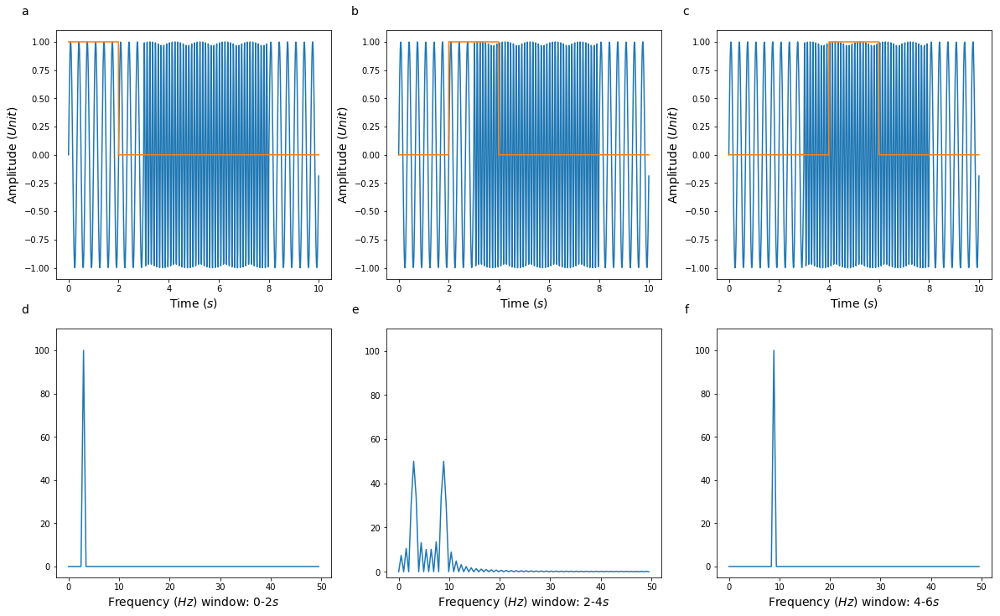

In [4]:
import numpy as np
import matplotlib.pyplot as plt

fig, ax = plt.subplots(2, 3, figsize=(20,12))

high_freq = 9
low_freq = 3

t1 = np.linspace(0, 3, 300, endpoint=False)
t2 = np.linspace(3, 8, 500, endpoint=False)
t3 = np.linspace(8, 10, 200, endpoint=False)
s1 = np.sin(2*np.pi*3*t1)
s2 = np.sin(2*np.pi*9*t2)
s3 = np.sin(2*np.pi*3*t3)
t_c = np.append(t1, np.append(t2, t3))
s_c = np.append(s1, np.append(s2, s3))

font_size = 14
labels_top = ['a', 'b', 'c']
labels_bottom = ['d', 'e', 'f']

for i in range(3):
    ax[0, i].plot(t_c,s_c)
    ax[0, i].set_xlabel('Time ($s$)', fontsize=font_size)
    ax[0, i].set_ylabel('Amplitude ($Unit$)', fontsize=font_size)
    ax[0, i].text(-0.1, 1.1, labels_top[i], transform=ax[0, i].transAxes,
      fontsize=font_size, va='top', ha='right')
    
    window_x = np.linspace(0, 10, 1000, endpoint=False)
    window_y = np.zeros(1000)

    t_c1 = t_c[200 * i: 200 * (i + 1)]
    s_c1 = s_c[200 * i: 200 * (i + 1)]
    
    for t_w in range(200 * i, 200 * (i + 1)):
        window_y[t_w] = 1
        
    ax[0, i].plot(window_x, window_y)

    Y = np.fft.fft(s_c1)

    N = len(Y)/2+1
    dt = t_c1[1] - t_c1[0]
    fa = 1.0/dt # scan frequency
    X = np.linspace(0, fa/2, N, endpoint=False)

    ax[1, i].plot(X, np.abs(Y[:N]))
    ax[1, i].set_xlabel('Frequency ($Hz$) window: ' + str(2 * i) + '-' + str(2 * (i + 1)) + '$s$', fontsize=font_size)
    ax[1, i].text(-0.1, 1.1, labels_bottom[i], transform=ax[1, i].transAxes,
      fontsize=font_size, va='top', ha='right')
    ax[1, i].set_ylim(ymax = 110)

plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/STFT.png', bbox_inches='tight')
plt.show()

# Spectrograms
Load the audio of the first song

In [5]:
import librosa, librosa.display
import FileHandler
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd

x, sr = librosa.load(FileHandler.get_full_audio_path(1))
font_size = 14

Export spectrogram (based on STFT)

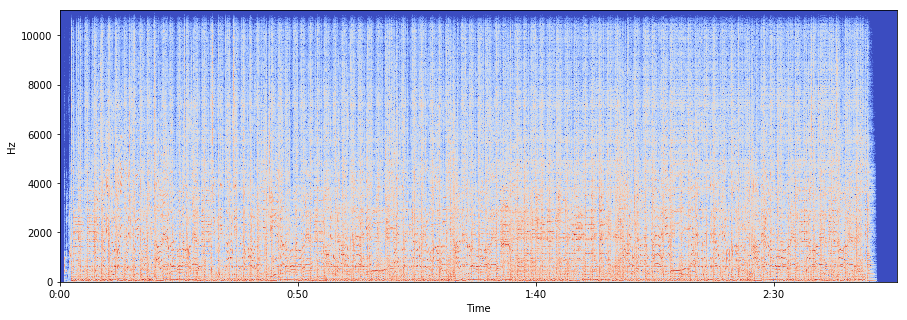

In [6]:
hop_length = 512
n_fft = 2048
X = librosa.stft(x, n_fft=n_fft, hop_length=hop_length)
S = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(15, 5))
librosa.display.specshow(S, sr=sr, x_axis='time', y_axis='linear')
plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/STFT_Spectrogram.png', bbox_inches='tight')

Export spectrogram (based on constant Q transform)

(84, 7573)


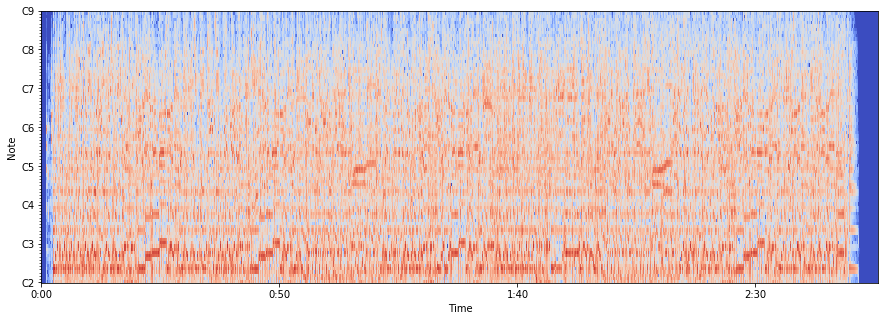

In [9]:
fmin = librosa.midi_to_hz(36)
C = librosa.cqt(x, sr=sr, fmin=fmin, n_bins=84)
print C.shape
logC = librosa.amplitude_to_db(abs(C))
plt.figure(figsize=(15, 5))
librosa.display.specshow(logC, sr=sr, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')
plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/CQT_Spectrogram.png', bbox_inches='tight')

Piano roll representation from MIDI file

(84, 17673)


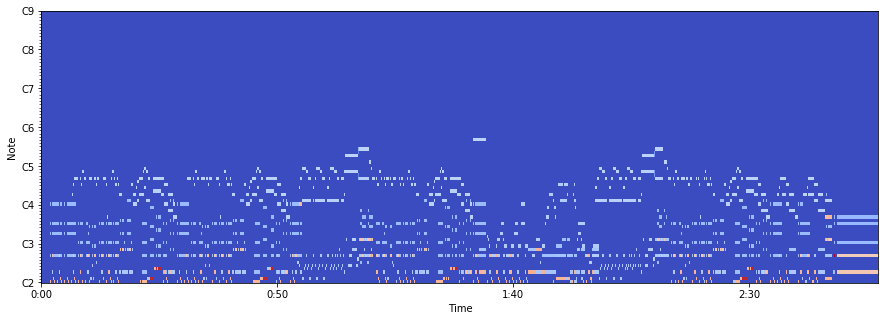

In [10]:
import pretty_midi
# Load MIDI file into PrettyMIDI object
midi_data = pretty_midi.PrettyMIDI(FileHandler.get_full_midi_path('001-002'))
X = midi_data.get_piano_roll(fs=100)
X = X[44:,:]
print X.shape
plt.figure(figsize=(15, 5))
librosa.display.specshow(X, sr = 51000, x_axis='time', y_axis='cqt_note', fmin=fmin, cmap='coolwarm')
plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/MIDI_PianoRoll.png', bbox_inches='tight')

Chromagram from audio file

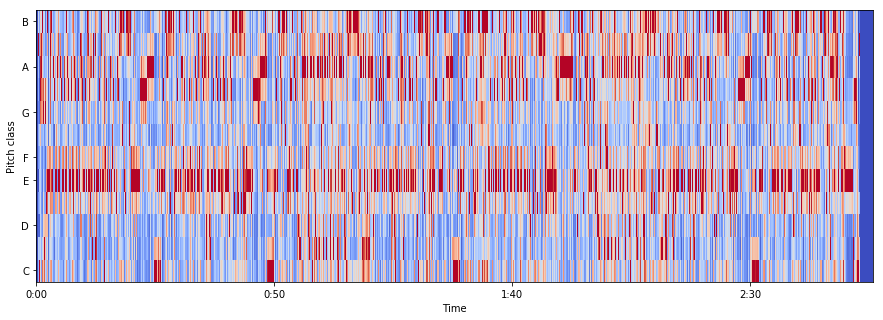

In [11]:
chromagram = librosa.feature.chroma_cqt(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
plt.savefig('/media/daphne/Seagate Expansion Drive/Data/Results/Figures/CQT_Chromagram.png', bbox_inches='tight')

# Data Set Statistics
First import all songs

In [15]:
import FileHandler
all_songs = FileHandler.get_all_songs()

## Durations of songs in our data set

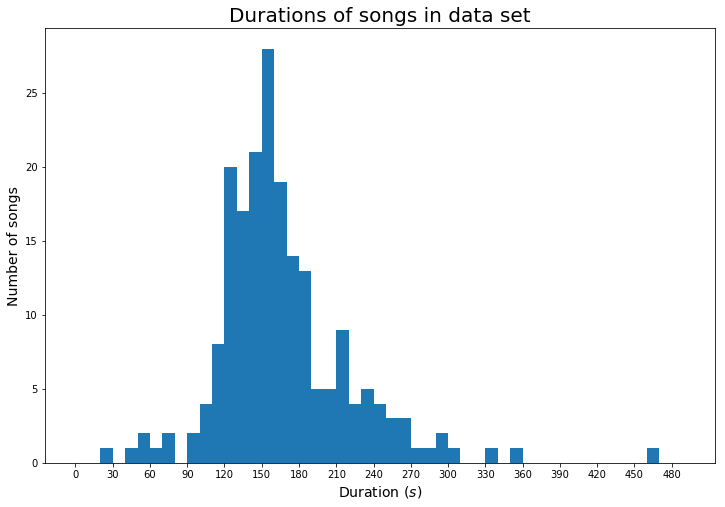

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Durations
durations = []
for song_key in all_songs:
    durations.append(all_songs[song_key].duration)

plt.figure(figsize=(12,8))
n, bins, patches = plt.hist(durations, np.arange(0,500, step=10))
plt.xlabel('Duration ($s$)', fontsize=14)
plt.xticks(np.arange(0, 500, step=30))
plt.ylabel('Number of songs', fontsize=14)
plt.title('Durations of songs in data set', fontsize=20)
plt.savefig(FileHandler._full_path_to('DataSet_Durations', 'rf'), bbox_inches='tight')

# Number of chord segments per song in our data set

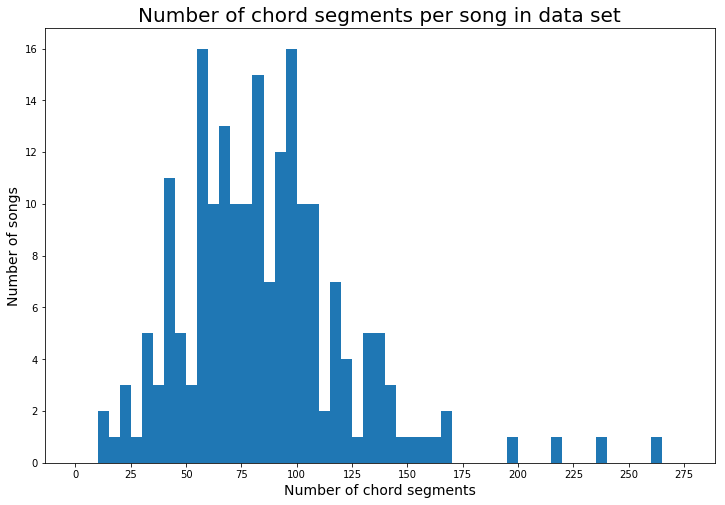

In [17]:
def get_nr_of_lines_from_lab(lab_file_path):
    with open(lab_file_path, 'r') as read_file:
        l = read_file.readlines()
    return len(l)

# Durations
nr_of_chords_gt = []
for song_key in all_songs:
    nr_of_chords_gt.append(get_nr_of_lines_from_lab(all_songs[song_key].full_ground_truth_chord_labs_path))

plt.figure(figsize=(12,8))
n, bins, patches = plt.hist(nr_of_chords_gt, np.arange(0,280, step=5))
plt.xlabel('Number of chord segments', fontsize=14)
plt.xticks(np.arange(0, 300, step=25))
plt.ylabel('Number of songs', fontsize=14)
plt.title('Number of chord segments per song in data set', fontsize=20)
plt.savefig(FileHandler._full_path_to('DataSet_NrChords', 'rf'), bbox_inches='tight')

## Number of MIDIs and Tabs per song in our data set

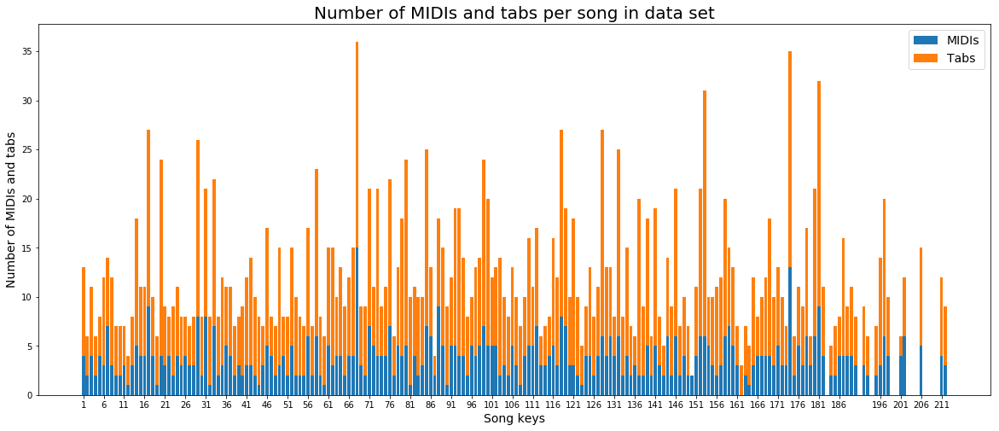

In [18]:
midi_index_path = FileHandler._full_path_to('IndexMIDI.csv', 'i')
midi_counters = dict()
for song_key in all_songs:
    midi_counters[song_key] = 0
with open(midi_index_path, 'r') as read_file:
    midi_lines = read_file.readlines()
for midi_line in midi_lines:
    song_key = int(midi_line.split()[0][:3])
    midi_counters[song_key] += 1
nr_of_midis = midi_counters.values()

tab_index_path = FileHandler._full_path_to('IndexTabs.csv', 'i')
tab_counters = dict()
for song_key in all_songs:
    tab_counters[song_key] = 0
with open(tab_index_path, 'r') as read_file:
    tab_lines = read_file.readlines()
for tab_line in tab_lines:
    song_key = int(tab_line.split(';')[2])
    if song_key in all_songs:
        tab_counters[song_key] += 1
nr_of_tabs = tab_counters.values()

plt.figure(figsize=(20,8))
midis = plt.bar(all_songs.keys(), nr_of_midis)
tabs = plt.bar(all_songs.keys(), nr_of_tabs, bottom=nr_of_midis)
plt.xlabel('Song keys', fontsize=14)
plt.xticks([k for k in all_songs.keys() if k%5==1])
plt.ylabel('Number of MIDIs and tabs', fontsize=14)
plt.title('Number of MIDIs and tabs per song in data set', fontsize=20)
plt.legend((midis[0], tabs[0]), ('MIDIs', 'Tabs'), fontsize=14)
plt.savefig(FileHandler._full_path_to('DataSet_NrOfMIDIandTabs', 'rf'), bbox_inches='tight')

# Audio ACE systems performance
## CSR

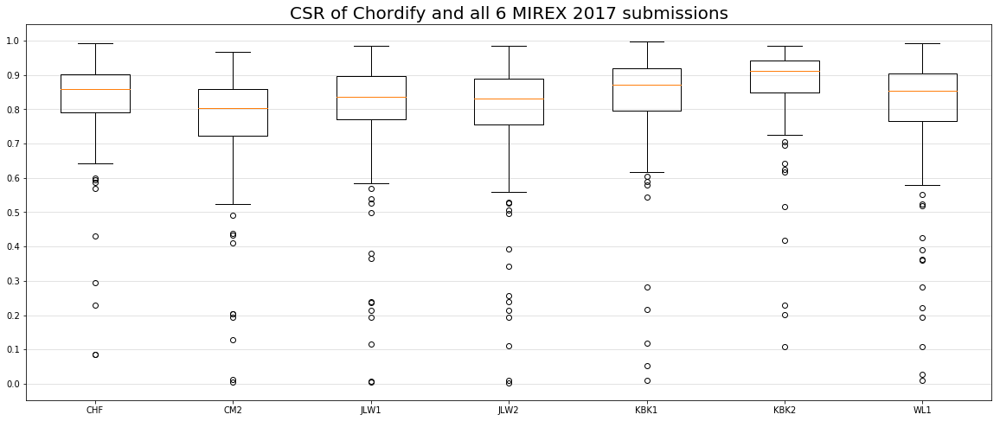

In [41]:
csrs, oversegs, undersegs, segs = [dict()], [dict()], [dict()], [dict()]
durations = []
for m_i in range(len(FileHandler.MIREX2017_SUBMISSION_NAMES)):
    csrs.append(dict())
    oversegs.append(dict())
    undersegs.append(dict())
    segs.append(dict())
    
with open(FileHandler.DATA_FUSION_RESULTS_PATH, 'r') as read_file:
    lines = read_file.readlines()
for line in lines[1:]:
    content = line.rstrip().split(';')
    song_key = int(content[0])
    durations.append(float(content[1]))
    for m_i in range(len(FileHandler.MIREX2017_SUBMISSION_NAMES) + 1):
        if content[2 + 28 * m_i] != '':
            csrs[m_i][song_key] = float(content[2 + 28 * m_i])
            oversegs[m_i][song_key] = float(content[3 + 28 * m_i])
            undersegs[m_i][song_key] = float(content[4 + 28 * m_i])
            segs[m_i][song_key] = float(content[5 + 28 * m_i])
            
labels = ['CHF']
for name in FileHandler.MIREX2017_SUBMISSION_NAMES:
    labels.append(name)

plt.figure(figsize=(20,8))
plt.boxplot([c.values() for c in csrs])
plt.xticks(np.arange(len(labels))+1,labels)
plt.yticks(np.linspace(0, 1, 11))
plt.grid(True, linestyle='-', which='major', axis='y', color='lightgrey', alpha=0.8)
plt.title('CSR of Chordify and all 6 MIREX 2017 submissions', fontsize=20)
plt.savefig(FileHandler._full_path_to('Audio_7_CSR', 'rf'), bbox_inches='tight')

## Oversegmentation

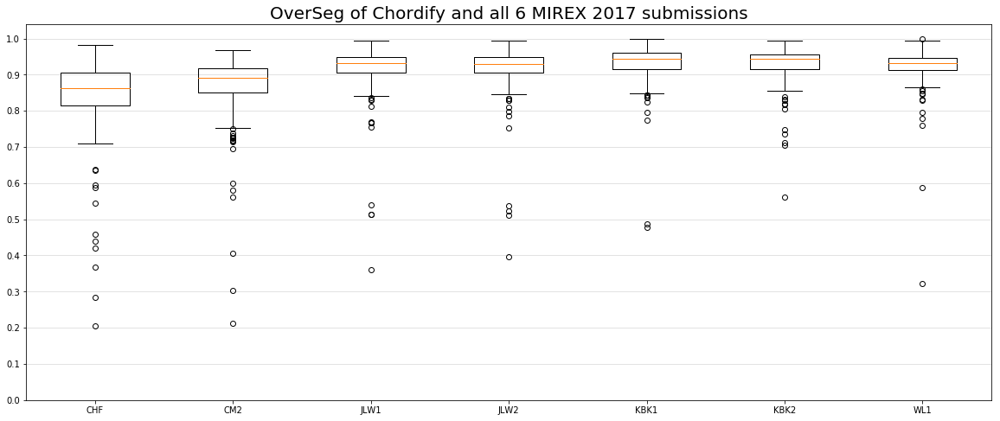

In [42]:
plt.figure(figsize=(20,8))
plt.boxplot([o.values() for o in oversegs])
plt.xticks(np.arange(len(labels))+1,labels)
plt.yticks(np.linspace(0, 1, 11))
plt.grid(True, linestyle='-', which='major', axis='y', color='lightgrey', alpha=0.8)
plt.title('OverSeg of Chordify and all 6 MIREX 2017 submissions', fontsize=20)
plt.savefig(FileHandler._full_path_to('Audio_7_OverSeg', 'rf'), bbox_inches='tight')

## Oversegmentation

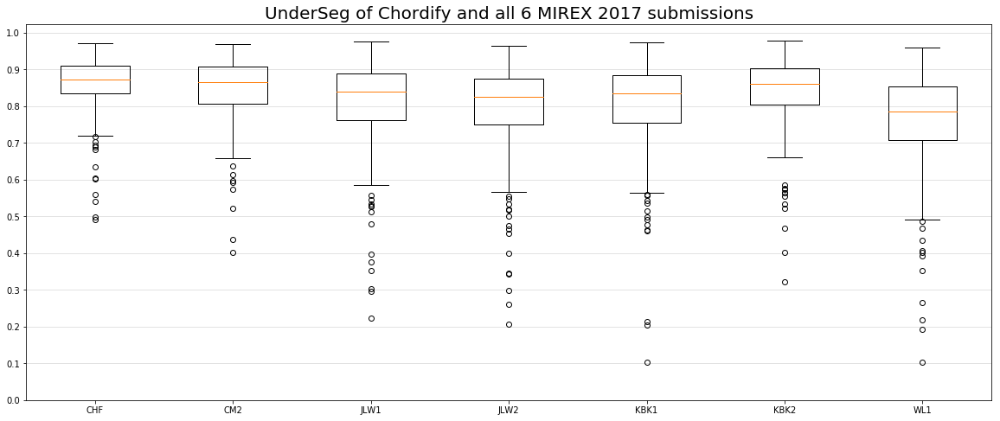

In [43]:
plt.figure(figsize=(20,8))
plt.boxplot([u.values() for u in undersegs])
plt.xticks(np.arange(len(labels))+1,labels)
plt.yticks(np.linspace(0, 1, 11))
plt.grid(True, linestyle='-', which='major', axis='y', color='lightgrey', alpha=0.8)
plt.title('UnderSeg of Chordify and all 6 MIREX 2017 submissions', fontsize=20)
plt.savefig(FileHandler._full_path_to('Audio_7_UnderSeg', 'rf'), bbox_inches='tight')

## Segmentation

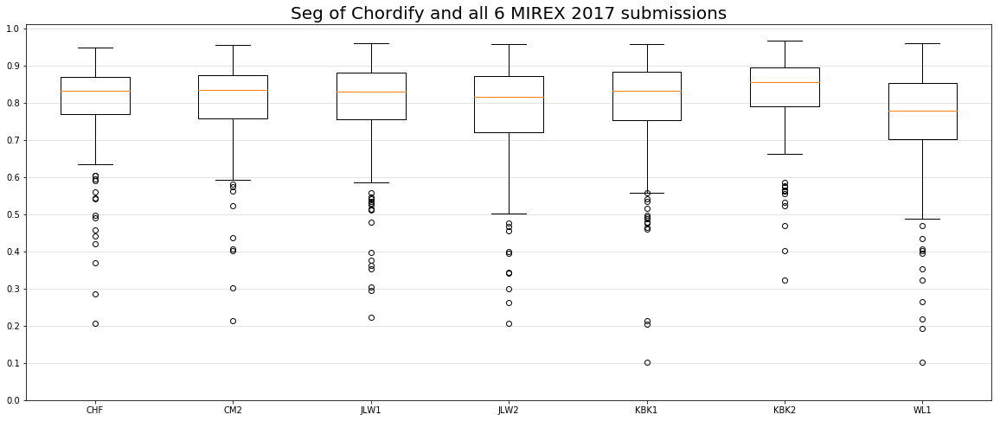

In [44]:
plt.figure(figsize=(20,8))
plt.boxplot([s.values() for s in segs])
plt.xticks(np.arange(len(labels))+1,labels)
plt.yticks(np.linspace(0, 1, 11))
plt.grid(True, linestyle='-', which='major', axis='y', color='lightgrey', alpha=0.8)
plt.title('Seg of Chordify and all 6 MIREX 2017 submissions', fontsize=20)
plt.savefig(FileHandler._full_path_to('Audio_7_Seg', 'rf'), bbox_inches='tight')

# Audio Chord Label Visualization
Export the visualized chord labels for all 7 audio ACE systems to /media/daphne/Seagate Expansion Drive/Data/Results/LabVisualisations/Audio

In [45]:
from math import ceil
import numpy as np
import ChordTemplateGenerator, Chords
import matplotlib as mpl
import matplotlib.pyplot as plt
from DataFusion import load_lab_file_into_chord_matrix, chords_list_to_alphabet, get_index_in_alphabet

def get_segmentation(song): # Only for visualisation purposes
    segmentation_file_path = song.full_ground_truth_chord_labs_path.replace('GT_ChordLabels', 'GT_SegmentationLabels')
    result = []
    with open(segmentation_file_path, 'r') as read_file:
        input_lines = read_file.readlines()
        for input_line in input_lines:
            parts = input_line.split()
            result.append((float(parts[0]), parts[2].rstrip()))
    return result

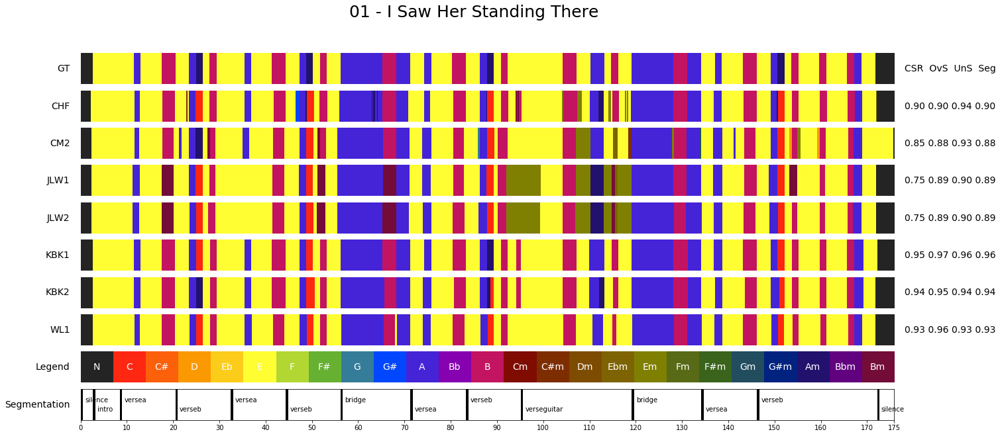

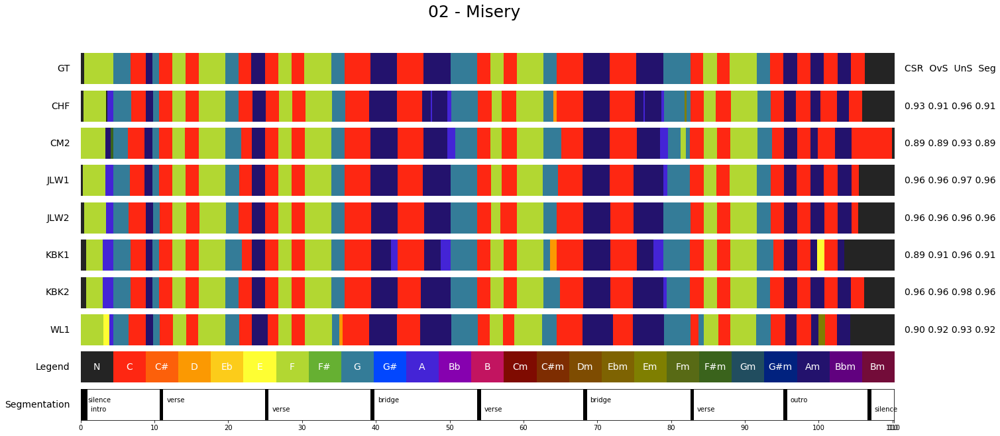

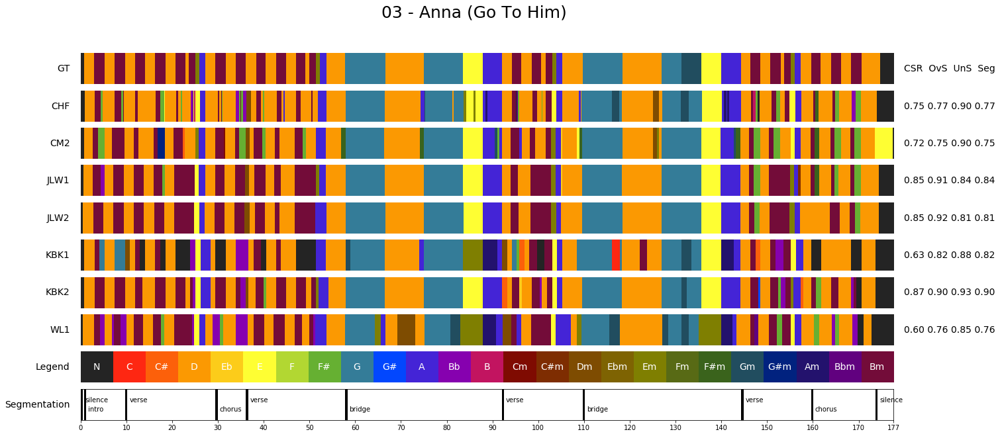

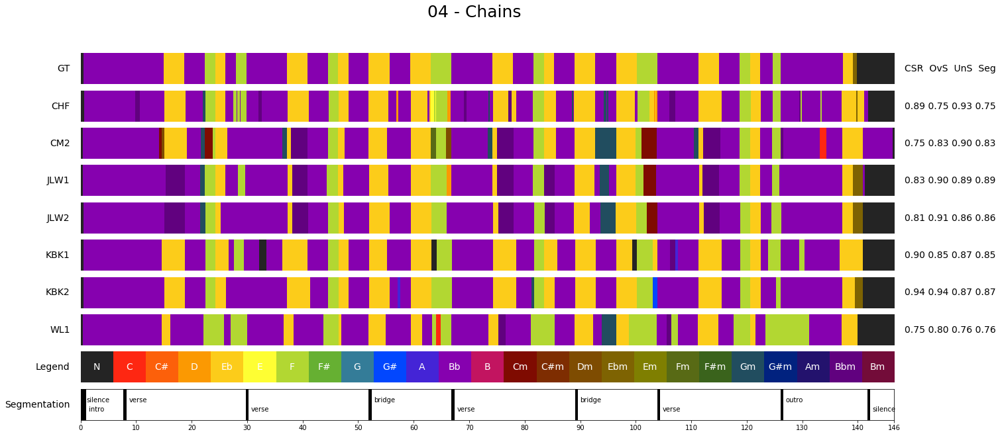

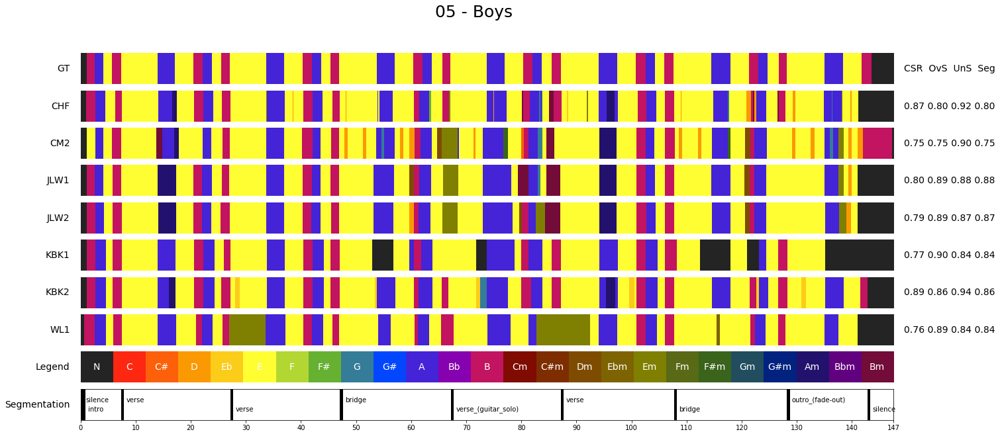

...

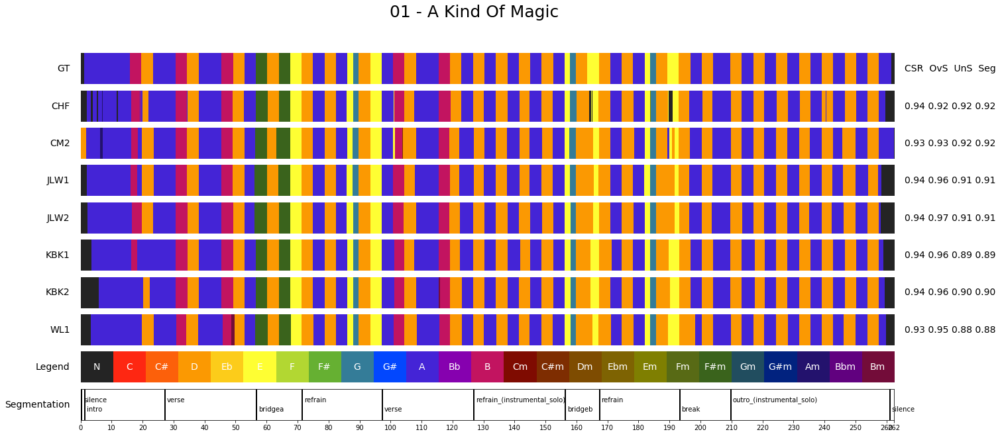

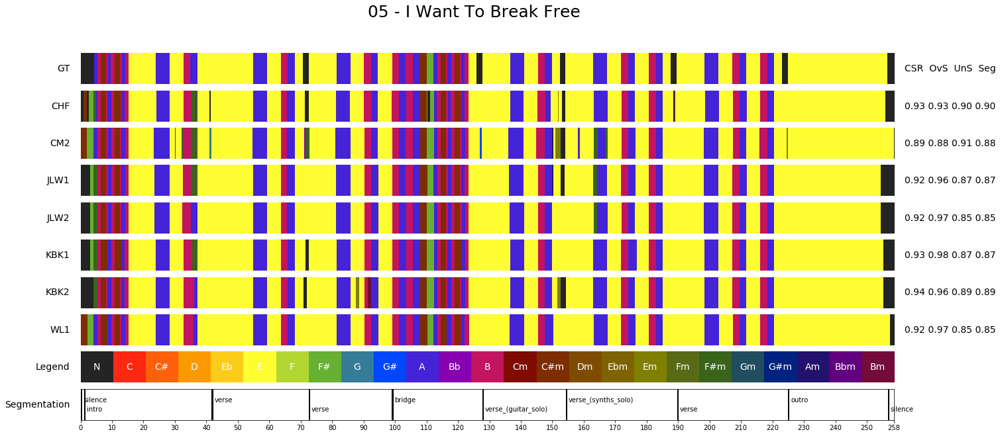

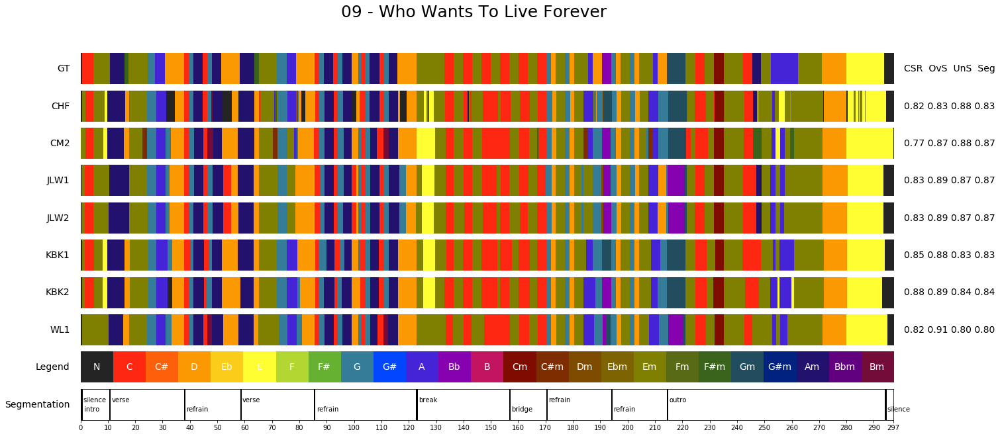

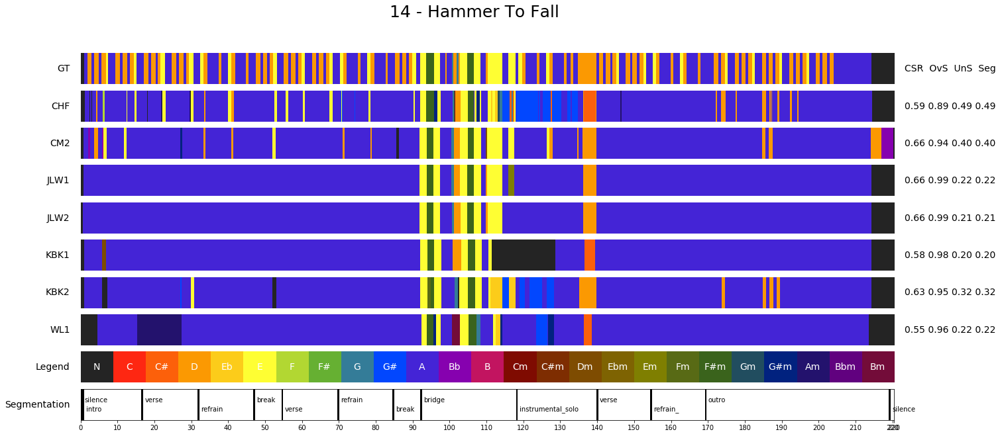

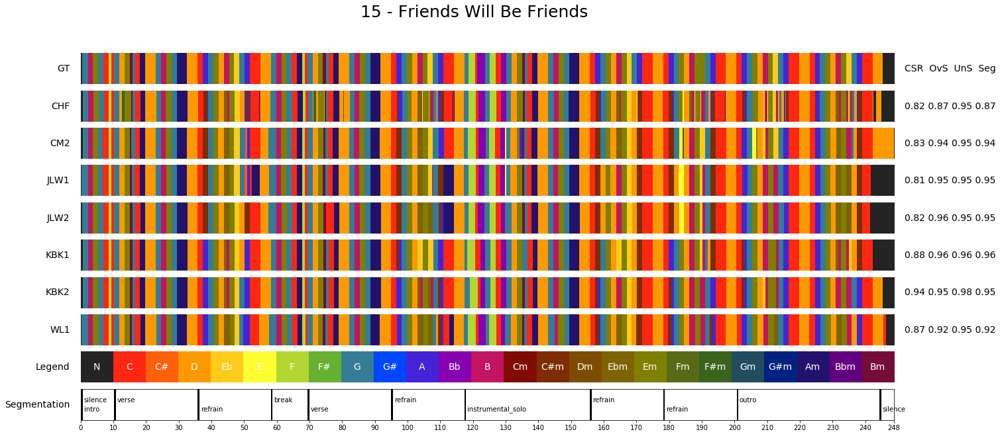

In [66]:
def show_chord_sequences(song, all_chords, names, results, alphabet):    
    all_chords.append(range(25))
    names.append('Legend')
    results.append('')

    c_map = mpl.colors.ListedColormap(['#242424', 
                                   '#FE2712', '#FC600A', '#FB9902', '#FCCC1A', '#FEFE33', '#B2D732', '#66B032', '#347C98', '#0247FE', '#4424D6', '#8601AF', '#C21460', 
                                   '#7f0b01', '#7e2d01', '#7e4c01', '#7e6302', '#7f7f01', '#586a15', '#3a631c', '#214d5f', '#01227f', '#23126d', '#61017f', '#730c39'])
    fig, axes = plt.subplots(len(all_chords) + 1, figsize=(22, 3 + len(all_chords) * 0.8))
    plt.suptitle(song.title, fontsize=25)

    for i in range(len(all_chords)):
        new_chords = all_chords[i]
        new_chords = np.vstack((new_chords, new_chords))
        
        font_weight = 'normal'

        axes[i].imshow(new_chords, aspect='auto', cmap=c_map, vmin=0, vmax=24)
        pos = list(axes[i].get_position().bounds)
        x_text = pos[0] - 0.01
        y_text = pos[1] + pos[3]/2.
        fig.text(x_text, y_text, names[i], va='center', ha='right', fontsize=14, fontweight=font_weight)
        fig.text(pos[0] + pos[2] + 0.01, y_text, results[i], va='center', ha='left', fontsize=14)
        axes[i].set_axis_off()

    for j in range(len(alphabet)):
        axes[len(all_chords) - 1].text(j, 0.5, alphabet[j], ha="center", va="center", color="w", fontsize=14)
        
    segmentation = get_segmentation(song)
    segment_starts = np.zeros(int(ceil(song.duration * 100)))
    for i in range(len(segmentation)):
        start_x = int(ceil(segmentation[i][0] * 100))
        for l in range(50):
            if start_x + l < len(segment_starts):
                segment_starts[start_x + l] = 1
        axes[len(all_chords)].text(start_x + 100, 0.2 + 0.6 * (i % 2), segmentation[i][1], va="center", fontsize=10)
    segment_starts = np.vstack((segment_starts, segment_starts))
    axes[len(all_chords)].imshow(segment_starts, aspect='auto', cmap='Greys')
    pos = list(axes[len(all_chords)].get_position().bounds)
    x_text = pos[0] - 0.01
    y_text = pos[1] + pos[3]/2.
    fig.text(x_text, y_text, 'Segmentation', va='center', ha='right', fontsize=14)
    
    ticks = [100 * x for x in range(int(song.duration) + 1)]
    ticks = [x for x in ticks if x % 1000 == 0]
    ticks.append(int(song.duration * 100))
    axes[len(all_chords)].set_xticks(ticks)
    axes[len(all_chords)].set_xticklabels([str(x / 100) for x in ticks])
    axes[len(all_chords)].get_yaxis().set_visible(False)
     
    return plt

def export_result_image(song_key, export_path=''):
    song = all_songs[song_key]

    labs = [['GT', song.full_ground_truth_chord_labs_path, 1.0, 1.0, 1.0, 1.0],
           ['CHF', song.full_chordify_chord_labs_path, csrs[0][song_key], oversegs[0][song_key], 
            undersegs[0][song_key], segs[0][song_key]]]
    
    for m_i in range(len(FileHandler.MIREX2017_SUBMISSION_NAMES)):
        name = FileHandler.MIREX2017_SUBMISSION_NAMES[m_i]
        labs.append([name, song.full_mirex_2017_chord_lab_paths[name], 
                     csrs[m_i + 1][song_key], oversegs[m_i + 1][song_key], 
                     undersegs[m_i + 1][song_key], segs[m_i + 1][song_key]])

    nr_of_samples = int(ceil(song.duration * 100))
    chords_list = ChordTemplateGenerator.generate_chroma_major_minor()
    alphabet = chords_list_to_alphabet(chords_list)

    # Fill a numpy array with chord labels for each of the lab files
    chord_matrix = np.zeros((len(labs), nr_of_samples), dtype=int)
    for lab_nr in range(len(labs)):
        load_lab_file_into_chord_matrix(labs[lab_nr][1], lab_nr, chord_matrix, alphabet, nr_of_samples)

    all_chords = [chord_matrix[x] for x in range(len(labs))]
    names = [labs[x][0] for x in range(len(labs))]
    results = [' '.join([str(round(labs[x][i], 2)).ljust(4, '0') for i in range(2, 6)]) for x in range(len(labs))]
    results[0] = 'CSR  OvS  UnS  Seg'

    plt = show_chord_sequences(song, all_chords, names, results, alphabet)
    
    if export_path == '':
        plt.show()
    else:
        plt.savefig(export_path, bbox_inches='tight')

for song_key in all_songs:
    if song_key in csrs[-1]:
        export_result_image(song_key, '/media/daphne/Seagate Expansion Drive/Data/Results/LabVisualisations/Audio/' + str(song_key) + '.png')